## Import Libraries

In [1]:
from __future__ import print_function
import os
import re
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import tensorflow as tf
import  pandas as pd
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
%matplotlib inline
%pylab inline
import matplotlib as mpl
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import _LRScheduler
import random
import math
import time
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
import scikitplot as skplt
import time


c:\users\parya\py36\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
c:\users\parya\py36\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
c:\users\parya\py36\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
c:\users\parya\py36\lib\site-packages\tensorflow\python\framework\dtypes.py:529: FutureWarning: Passing (type, 1) or '1ty

Populating the interactive namespace from numpy and matplotlib


In [2]:
# import random
# a=random.randint(500,1000)
# print(a)
torch.manual_seed(5000)

path_read='C:/Users/Parya/Desktop/data/LSTM_paper/final/'
path_save='C:/Users/Parya/Desktop/data/LSTM_paper/final/filtered2/'

# Input parameters

In [3]:
batch_size = 128
TH=25
input_dim = 1    
hidden_dim =2
layer_dim = 2
output_dim1 =40
output_dim2 = 10
output_dim3 = 2
output_dim4 = 1000
seq_dim = 701

lr = 0.001
num_epochs=300

## Import data

In [4]:

Input = pd.read_csv(path_read+"input_without_noise_final.csv", header=None)
y_reg = pd.read_csv(path_read+"target_without_noise_final.csv", header=None)
y_class = pd.read_csv(path_read+"target_values.csv", header=None)
y_class =y_class.replace(y_class.where(y_class <= TH), 0)
y_class = y_class.replace(y_class.where(y_class > TH), 1)

## Preprocess data

In [5]:
Input=Input.iloc[:, :].values
y_reg=y_reg.iloc[:, :].values

#Onehot encoding

enc = preprocessing.OneHotEncoder()
enc.fit(y_class)
y_class = enc.transform(y_class).toarray()


# Remove mean / max (Input/targets)

Input_mean=np.mean(Input)
Input_removed_mean=Input-Input_mean
Input_max=np.max(Input_removed_mean)
Input_preprocess =  Input_removed_mean/Input_max
Input = Input_preprocess

y_reg_mean=np.mean(y_reg)
y_reg_removed_mean=y_reg-y_reg_mean
y_reg_max=np.max(y_reg_removed_mean)
y_reg_preprocess=y_reg_removed_mean/y_reg_max

# Concatenate targets

target=np.append(y_reg_preprocess,y_class,axis=1)



x_train, x_test, y_train, y_test = train_test_split(Input, target, test_size=0.2, random_state=42)


c:\users\parya\py36\lib\site-packages\sklearn\preprocessing\_encoders.py:371: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [6]:
y_plot_train=y_train[:,0:701]
y_plot_test=y_test[:,0:701]

## Separate classification and regression data

In [7]:
# Regression

train_x = Variable(torch.from_numpy(x_train).float())
train_x = train_x.unsqueeze_(-1)

test_x = Variable(torch.from_numpy(x_test).float())
test_x = test_x.unsqueeze_(-1)

train_y1 = Variable(torch.from_numpy(y_train[:,0:701]).float())
train_y1 = train_y1.unsqueeze_(-1)

test_y1 = Variable(torch.from_numpy(y_test[:,0:701]).float())
test_y1 = test_y1.unsqueeze_(-1)

#Classification

#Classification

train_y2 = Variable(torch.from_numpy(np.reshape(y_train[:,701:702], (1,np.product(y_train[:,701:702].shape)))[0]).long())
test_y2 = Variable(torch.from_numpy(np.reshape(y_test[:,701:702], (1,np.product(y_test[:,701:702].shape)))[0]).long())

## Dataset and Dataloader

In [8]:


train_dataset = TensorDataset(train_x, train_y1,train_y2)
test_dataset = TensorDataset(test_x, test_y1 ,test_y2)


train_iterator = DataLoader(train_dataset, batch_size = batch_size,shuffle=True, num_workers=0)
test_iterator = DataLoader(test_dataset, batch_size = batch_size, shuffle=False, num_workers=0)

# Classification loss function

In [9]:
class Classification_Loss(nn.modules.Module):    
    def __init__(self):
        super(Classification_Loss,self).__init__()
    def forward(self, outputs, labels):
         return torch.sum(torch.clamp(1 - outputs.t()*labels, min=0))/batch_size

## Define network

In [10]:
class LSTMClassifier(nn.Module):
    
    def __init__(self, input_dim,seq_dim, hidden_dim, layer_dim, output_dim1, output_dim2, output_dim3, output_dim4):
        super().__init__()
        self.hidden_dim = hidden_dim
        self.layer_dim = layer_dim
        self.output_dim1 = output_dim1
        self.output_dim2 = output_dim2
        self.output_dim3 = output_dim3
        self.output_dim4 = output_dim4
        self.seq_dim = seq_dim
        
        self.rnn = nn.LSTM(input_dim, hidden_dim, layer_dim, batch_first=True)
        self.fc1 = nn.Linear(hidden_dim*seq_dim, output_dim1)
        self.dropout1 = nn.Dropout2d(0.25)
        self.fc2 = nn.Linear(output_dim1, output_dim2)
        self.dropout2 = nn.Dropout2d(0.25)
        self.fc3 = nn.Linear(output_dim2, output_dim3)

        
        self.fc4 = nn.Linear(hidden_dim*seq_dim, output_dim4)
        self.fc5 = nn.Linear(output_dim4, seq_dim)

        
        self.batch_size = None
        self.hidden = None
    
    def forward(self, x):
        
        #LSTM
        h0, c0 = self.init_hidden(x)
        out, (hn, cn) = self.rnn(x, (h0, c0))
        out = out.reshape(-1, hidden_dim*seq_dim )

        #Classification
        output11 = F.relu(self.fc1(out))  
        out_drop1 = self.dropout1(output11)
#         out_drop1 = self.fc2(out_drop1)
        output12 = F.relu(self.fc2(out_drop1))
        out_drop2 = self.dropout1(output12)
        out1 = self.fc3(out_drop2)
        
        #Regression
        out12 = F.relu(self.fc4(out))
        out22 = self.fc5(out12)
        out2 = out22.reshape(-1,seq_dim,1)

        return out1 , out2
    
    def init_hidden(self, x):
        h0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim)
        c0 = torch.zeros(self.layer_dim, x.size(0), self.hidden_dim)
        return [t.cuda() for t in (h0, c0)]

In [11]:

iterations_per_epoch = len(train_iterator)
best_acc = 0
patience, trials = 100, 0
model = LSTMClassifier(input_dim, seq_dim, hidden_dim, layer_dim, output_dim1, output_dim2 ,output_dim3 ,output_dim4 )
model = model.cuda()
criterion1 = nn.CrossEntropyLoss()
criterion2 = nn.MSELoss()
opt = torch.optim.Adam(model.parameters(), lr=lr)


# Train the model

Start model training
Epoch:  0
Epoch [1/300], Averge Loss:for epoch[1, 1.0127]
Epoch:  1
Epoch [2/300], Averge Loss:for epoch[2, 0.7784]
Epoch:  2
Epoch [3/300], Averge Loss:for epoch[3, 0.6920]
Epoch:  3
Epoch [4/300], Averge Loss:for epoch[4, 0.6484]
Epoch:  4
Epoch [5/300], Averge Loss:for epoch[5, 0.6662]
Epoch:  5
Epoch [6/300], Averge Loss:for epoch[6, 0.6445]
Epoch:  6
Epoch [7/300], Averge Loss:for epoch[7, 0.6232]
Epoch:  7
Epoch [8/300], Averge Loss:for epoch[8, 0.6409]
Epoch:  8
Epoch [9/300], Averge Loss:for epoch[9, 0.6493]
Epoch:  9
Epoch [10/300], Averge Loss:for epoch[10, 0.5992]
Epoch:  10
Epoch [11/300], Averge Loss:for epoch[11, 0.6223]
Epoch:  11
Epoch [12/300], Averge Loss:for epoch[12, 0.6064]
Epoch:  12
Epoch [13/300], Averge Loss:for epoch[13, 0.5990]
Epoch:  13
Epoch [14/300], Averge Loss:for epoch[14, 0.6039]
Epoch:  14
Epoch [15/300], Averge Loss:for epoch[15, 0.6234]
Epoch:  15
Epoch [16/300], Averge Loss:for epoch[16, 0.5979]
Epoch:  16
Epoch [17/300], Aver

Epoch [135/300], Averge Loss:for epoch[135, 0.1572]
Epoch:  135
Epoch [136/300], Averge Loss:for epoch[136, 0.1587]
Epoch:  136
Epoch [137/300], Averge Loss:for epoch[137, 0.1538]
Epoch:  137
Epoch [138/300], Averge Loss:for epoch[138, 0.1471]
Epoch:  138
Epoch [139/300], Averge Loss:for epoch[139, 0.1514]
Epoch:  139
Epoch [140/300], Averge Loss:for epoch[140, 0.1441]
Epoch:  140
Epoch [141/300], Averge Loss:for epoch[141, 0.1504]
Epoch:  141
Epoch [142/300], Averge Loss:for epoch[142, 0.1530]
Epoch:  142
Epoch [143/300], Averge Loss:for epoch[143, 0.1610]
Epoch:  143
Epoch [144/300], Averge Loss:for epoch[144, 0.1657]
Epoch:  144
Epoch [145/300], Averge Loss:for epoch[145, 0.1483]
Epoch:  145
Epoch [146/300], Averge Loss:for epoch[146, 0.1562]
Epoch:  146
Epoch [147/300], Averge Loss:for epoch[147, 0.1446]
Epoch:  147
Epoch [148/300], Averge Loss:for epoch[148, 0.1432]
Epoch:  148
Epoch [149/300], Averge Loss:for epoch[149, 0.1477]
Epoch:  149
Epoch [150/300], Averge Loss:for epoch[1

Epoch [265/300], Averge Loss:for epoch[265, 0.1203]
Epoch:  265
Epoch [266/300], Averge Loss:for epoch[266, 0.1264]
Epoch:  266
Epoch [267/300], Averge Loss:for epoch[267, 0.1205]
Epoch:  267
Epoch [268/300], Averge Loss:for epoch[268, 0.1162]
Epoch:  268
Epoch [269/300], Averge Loss:for epoch[269, 0.1208]
Epoch:  269
Epoch [270/300], Averge Loss:for epoch[270, 0.1219]
Epoch:  270
Epoch [271/300], Averge Loss:for epoch[271, 0.1167]
Epoch:  271
Epoch [272/300], Averge Loss:for epoch[272, 0.1186]
Epoch:  272
Epoch [273/300], Averge Loss:for epoch[273, 0.1194]
Epoch:  273
Epoch [274/300], Averge Loss:for epoch[274, 0.1164]
Epoch:  274
Epoch [275/300], Averge Loss:for epoch[275, 0.1334]
Epoch:  275
Epoch [276/300], Averge Loss:for epoch[276, 0.1142]
Epoch:  276
Epoch [277/300], Averge Loss:for epoch[277, 0.1253]
Epoch:  277
Epoch [278/300], Averge Loss:for epoch[278, 0.1159]
Epoch:  278
Epoch [279/300], Averge Loss:for epoch[279, 0.1205]
Epoch:  279
Epoch [280/300], Averge Loss:for epoch[2

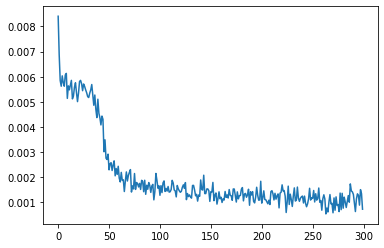

In [12]:
print('Start model training')
train_acc = []
train_loss = []

train_total = 0
train_correct = 0

loss_values=[]

total_step = len(train_iterator)
correct, total = 0, 0

for epoch in range(num_epochs):
    if epoch%100==0:
        lr /= 4
    avg_loss_epoch = 0
    batch_loss = 0
    total_batches = 0
    print('Epoch: ', epoch)
    running_loss = 0.0
    ypred_train = []
    y_pred_class_train=[]
    y_real_class_train=[]
    for i, (x_batch1, y_batch1, y_batch2) in enumerate(train_iterator):
        model.train()
        x_batch = x_batch1.cuda()       
        y_batch1 = y_batch1.cuda()
        y_batch2 = y_batch2.cuda()     
        
        opt.zero_grad()
        out1 , out2 = model(x_batch)
#         print(out2.dtype, y_batch1.dtype)
#         aa=input("================")
#         print(out1.dtype, y_batch2.dtype)
#         aa=input("================")
        loss1 = criterion1(out1, y_batch2)
        loss2 = criterion2(out2, y_batch1)
        
        
#         print(out1.shape, y_batch2.shape)
        loss= loss1 + loss2
        loss.backward()
        opt.step()
        running_loss =+ loss.item() 
        total_batches += 1     
        batch_loss += loss.item()
    loss_values.append(running_loss / len(x_batch))
    avg_loss_epoch = batch_loss/total_batches
    print ('Epoch [{}/{}], Averge Loss:for epoch[{}, {:.4f}]' 
                   .format(epoch+1, num_epochs, epoch+1, avg_loss_epoch ))
plt.plot(loss_values)        
print('End model training')   



# Model evaluation

In [13]:
# Train
for train_input, train_target1, train_target2 in train_iterator:
    train_input = train_input.cuda()
    train_target1 = train_target1.cuda()
    train_target2 = train_target2.cuda()
    pred1_train , pred2_train = model(train_input)
    pred1_train = F.softmax(pred1_train)
    pred1_train = pred1_train.data >= 0.5
    train_pred_classification = pred1_train[:,1].cpu().data.numpy().astype(int)
    train_pred_translation = pred2_train.cpu().data.numpy()
    train_real_classification = train_target2.cpu().data.numpy()
    train_real_translation = train_target1.cpu().data.numpy()

l=[]   
# Test
for test_input, test_target1, test_target2 in test_iterator:
    test_input = test_input.cuda()
    test_target1 = test_target1.cuda()
    test_target2 = test_target2.cuda()
    pred1_test , pred2_test = model(test_input)
    pred1_test = F.softmax(pred1_test)
    pred1_test = pred1_test.data >= 0.5
    test_pred_classification = pred1_test[:,1].long().cpu().data.numpy().astype(int)
    test_pred_translation = pred2_test.cpu().data.numpy()
    test_real_classification = test_target2.cpu().data.numpy()
    test_real_translation = test_target1.cpu().data.numpy()
     


c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:7: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  import sys
c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:21: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


# MSE

In [14]:
from sklearn.metrics import mean_squared_error, r2_score


mse_train = []
mse_test = []
for i in range(len(test_real_translation)):

    MSE_test = mean_squared_error(test_real_translation[i] ,  test_pred_translation[i])
    mse_test.append((MSE_test))
    
for i in range(len(train_real_translation)):
    MSE_train = mean_squared_error(train_real_translation[i] ,  train_pred_translation[i])
    mse_train.append((MSE_train))

test_mse=np.mean(mse_test)
train_mse=np.mean(mse_train)

print('MSE train set:', train_mse , 'MSE test set:', test_mse)

MSE train set: 0.0011525318 MSE test set: 0.0012793221


# R2-score

In [15]:
R2_score_train = []
R2_score_test = []
for i in range(len(test_real_translation)):

    R2_test = r2_score(test_real_translation[i] ,  test_pred_translation[i])
    R2_score_test.append((R2_test))
    
for i in range(len(train_real_translation)):
    
    R2_train = r2_score(train_real_translation[i] ,  train_pred_translation[i])
    R2_score_train.append((R2_train))

test_R2_score=np.mean(R2_score_test)
train_R2_score=np.mean(R2_score_train)

print('R2_score train set:', train_R2_score , 'R2_score test set:', test_R2_score)

R2_score train set: 0.9960873874453668 R2_score test set: 0.9956876127188571


# Accuracy

In [16]:
acc_train=accuracy_score(train_real_classification, train_pred_classification)
acc_test=accuracy_score(test_real_classification, test_pred_classification)
print('Classification Accuracy train set:', '%.2f'%acc_train , 'Classification Accuracy test set:', '%.2f'%acc_test)

Classification Accuracy train set: 0.93 Classification Accuracy test set: 0.99


In [17]:
# target_names=['With Ikr block < 40%', 'With Ikr block > 40%']

# train_real_classification = train_real_classification[:,1]
# train_pred_classification_MSE = train_pred_classification_MSE[:,1]

# test_real_classification = test_real_classification[:,1]
# test_pred_classification_MSE = test_pred_classification_MSE[:,1]

# confusion_matrix(train_real_classification, train_pred_classification_MSE, labels=target_names)

In [18]:
target_names=['Class1', 'Class2' ]

print("Classifier training performance:")
print(classification_report(train_real_classification, train_pred_classification, target_names=target_names))

print("Classifier test performance:")
print(classification_report(test_real_classification, test_pred_classification, target_names=target_names))

Classifier training performance:
              precision    recall  f1-score   support

      Class1       0.86      0.91      0.89        34
      Class2       0.96      0.93      0.95        76

   micro avg       0.93      0.93      0.93       110
   macro avg       0.91      0.92      0.92       110
weighted avg       0.93      0.93      0.93       110

Classifier test performance:
              precision    recall  f1-score   support

      Class1       0.96      1.00      0.98        24
      Class2       1.00      0.99      0.99        68

   micro avg       0.99      0.99      0.99        92
   macro avg       0.98      0.99      0.99        92
weighted avg       0.99      0.99      0.99        92



## ROC PLot

In [19]:
import importlib
importlib.reload(mpl); importlib.reload(plt); importlib.reload(sns)

<module 'seaborn' from 'c:\\users\\parya\\py36\\lib\\site-packages\\seaborn\\__init__.py'>

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()


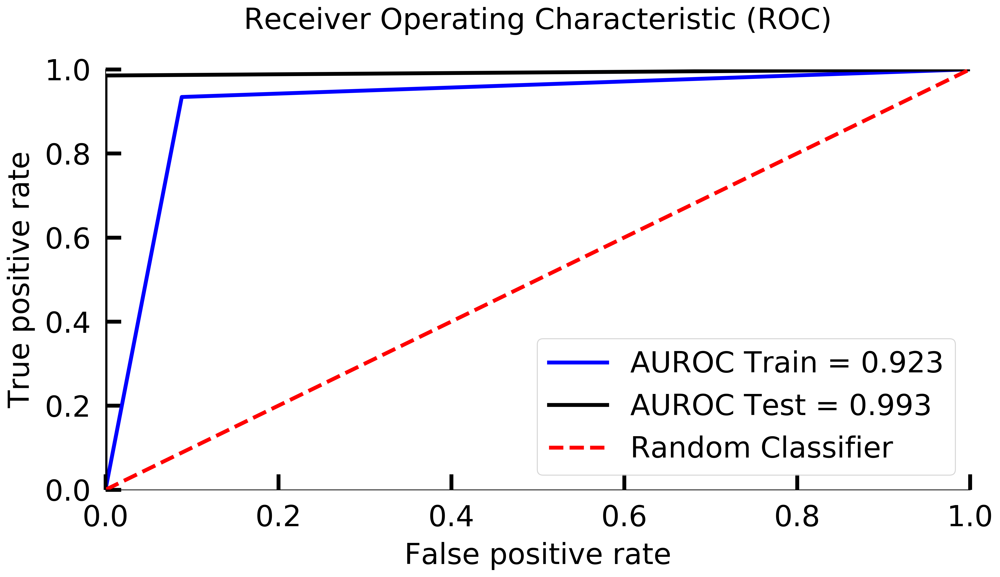

In [20]:
# #Print Area Under Curve ANN
fig=plt.figure(num=None, figsize=(16, 8), dpi=300)


rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(0, 1) 
plt.xlim(0, 1)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,1.1, step=0.2),fontsize=30) 
plt.yticks(np.arange(0,1.1, step=0.2),fontsize=30)

false_positive_rate1, recall1, thresholds1 = roc_curve(train_real_classification, train_pred_classification)
false_positive_rate2, recall2, thresholds2 = roc_curve(test_real_classification, test_pred_classification)

roc_auc1 = auc(false_positive_rate1, recall1)
roc_auc2 = auc(false_positive_rate2, recall2)

ttl = plt.title('Receiver Operating Characteristic (ROC)', fontsize=30 , pad =20)
ttl.set_position([.5, 1.05])

ax.plot(false_positive_rate1, recall1, 'b',linewidth=4, label = 'AUROC Train = %0.3f' %roc_auc1)
ax.plot(false_positive_rate2, recall2, 'k',linewidth=4, label = 'AUROC Test = %0.3f' %roc_auc2)


plt.plot([0,1], [0,1], 'r--',linewidth=4, label='Random Classifier')
plt.legend(loc='lower right', fontsize=30)
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.ylabel('True positive rate', fontsize=30,labelpad=10)
plt.xlabel('False positive rate', fontsize=30,labelpad=10)
# plt.show()
 
# fig.savefig(path_save+'ROC.eps', dpi = 300, bbox_inches = 'tight')
fig.savefig('D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/Fig82class', dpi = 300, bbox_inches = 'tight')

# APD90

In [21]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

In [94]:
# Train

APD90_real_train=[]
for i in range(len(train_real_translation)):
    mai = train_real_translation[i,7]
    mii = train_real_translation[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(train_real_translation[i], l)
    p=np.where(train_real_translation[i]==t)
    APD90_real_train.append(p[0])
    
APD90_real_train2=pd.DataFrame(APD90_real_train) 
APD90_real_train2.to_csv(path_save+"APD90_real_train.csv",header=None)

APD90_pred_train=[]
for i in range(len(train_pred_translation)):
    mai = train_pred_translation[i,7]
    mii = train_pred_translation[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(train_pred_translation[i], l)
    p=np.where(train_pred_translation[i]==t)
    APD90_pred_train.append(p[0])
    
APD90_pred_train2=pd.DataFrame(APD90_pred_train) 
APD90_pred_train2.to_csv(path_save+"APD90_predict_train.csv",header=None)

Error=[]    
for i in range(len(train_pred_translation)):
    e=100*abs((np.array(APD90_pred_train[i])-np.array(APD90_real_train[i]))/np.array(APD90_real_train[i]))
    Error.append(e)
    
mean_APD90_error_train= np.mean(np.array(Error))
print("Error APD90 normal:" , mean_APD90_error_train)

Error APD90 normal: 2.911908677685995


In [93]:
# Test

APD90_real_test=[]
for i in range(len(test_real_translation)):
    mai = test_real_translation[i,7]
    mii = test_real_translation[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(test_real_translation[i], l)
    p=np.where(test_real_translation[i]==t)
    APD90_real_test.append(p[0])
    
APD90_real_test2=pd.DataFrame(APD90_real_test) 
APD90_real_test2.to_csv(path_save+"APD90_real_test.csv",header=None)

APD90_pred_test=[]
for i in range(len(test_pred_translation)):
    mai = test_pred_translation[i,7]
    mii = test_pred_translation[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(test_pred_translation[i], l)
    p=np.where(test_pred_translation[i]==t)
    APD90_pred_test.append(p[0])
    
APD90_pred_test2=pd.DataFrame(APD90_pred_test) 
APD90_pred_test2.to_csv(path_save+"APD90_predict_test.csv",header=None)

    
Error=[]    
for i in range(len(test_pred_translation)):
    e=100*abs((np.array(APD90_pred_test[i])-np.array(APD90_real_test[i]))/np.array(APD90_real_test[i]))
    Error.append(e)
    
mean_APD90_error_test= np.mean(np.array(Error))
print("Error APD90 normal:" , mean_APD90_error_test)

Error APD90 normal: 3.217213805930484


## Train test plots

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:25: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


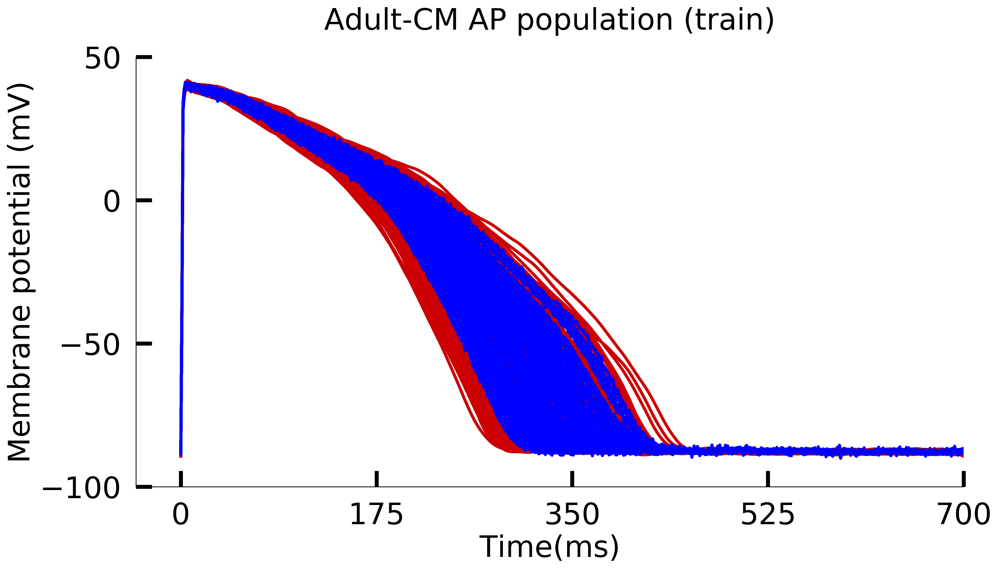

In [24]:
# Train

y_train_plot = y_train[:,0:701]
y_train_plot = (y_train_plot*y_reg_max)+y_reg_mean

train_x_plot = train_x.cuda()

predictions_train1, predictions_train2  = model(train_x_plot)
pred_plot_train = predictions_train2.cpu().data.numpy()

pred_plot_train = pred_plot_train.reshape((pred_plot_train.shape[0], pred_plot_train.shape[1] ))
pred_plot_train=(pred_plot_train*y_reg_max)+y_reg_mean

#figure properties

fig=plt.figure(num=None, figsize=(15, 8), dpi=300)


rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=30) 
plt.yticks(np.arange(-100,51, step=50),fontsize=30)
ax.plot(y_train_plot.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')
ax.plot(pred_plot_train.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
handles, labels = ax.get_legend_handles_labels()
display = (0,400)
plt.xlabel("Time(ms)",fontsize=30)
plt.ylabel("Membrane potential (mV)",fontsize=30)
ttl=plt.title("Adult-CM AP population (train)",fontsize=30)
ttl.set_position([.5, 1.05])
fig.savefig(path_save+'translator_output_train.eps', dpi = 300, bbox_inches = 'tight')

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:25: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


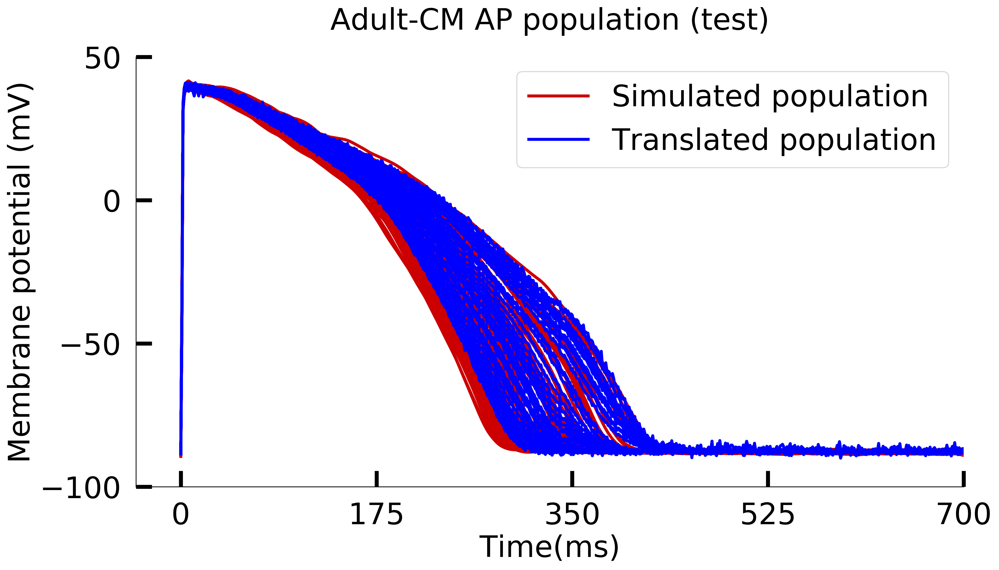

In [25]:
# Test

y_test_plot = y_test[:,0:701]
y_test_plot = (y_test_plot*y_reg_max)+y_reg_mean

test_x_plot = test_x.cuda()

predictions_test1, predictions_test2  = model(test_x_plot)
pred_plot_test = predictions_test2.cpu().data.numpy()

pred_plot_test = pred_plot_test.reshape((pred_plot_test.shape[0], pred_plot_test.shape[1] ))
pred_plot_test=(pred_plot_test*y_reg_max)+y_reg_mean

#figure properties

fig=plt.figure(num=None, figsize=(15, 8), dpi=300)


rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=30) 
plt.yticks(np.arange(-100,51, step=50),fontsize=30)
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
ax.plot(y_test_plot.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')

ax.plot(pred_plot_test.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
handles, labels = ax.get_legend_handles_labels()
display = (0,100)

plt.xlabel("Time(ms)",fontsize=30)
plt.ylabel("Membrane potential (mV)",fontsize=30)
# plt.legend(loc='best', prop={'size': 18, 'weight':'bold' })
ax.legend([handle for i,handle in enumerate(handles) if i in display],
      [label for i,label in enumerate(labels) if i in display], loc = 'best', prop={'size': 30})
ttl = plt.title("Adult-CM AP population (test)",fontsize=30)
ttl.set_position([.5, 1.05])

fig.savefig(path_save+'translator_output_test.eps', dpi = 300, bbox_inches = 'tight')

# Ditribution plot

# Train

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


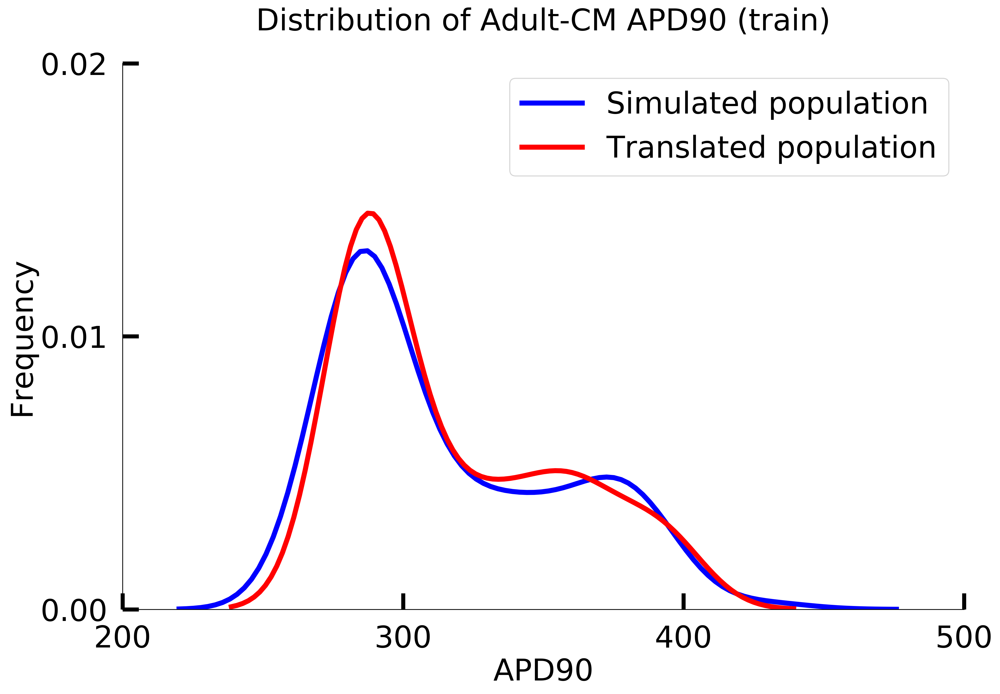

In [26]:
dist_train_real=pd.read_csv(path_save+"APD90_real_train.csv",header=None)
dist_train_predict=pd.read_csv(path_save+"APD90_predict_train.csv",header=None)
dist_train_real=dist_train_real.iloc[:, 1].values
dist_train_predict=dist_train_predict.iloc[:, 1].values

plt.figure(num=None, figsize=(15, 10), dpi=300)

rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)


plt.xlim(200, 500) 
plt.ylim(0, 0.02)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,501, step=100),fontsize=30) 
plt.yticks(np.arange(0,0.021, step=0.01),fontsize=30)
 


# plt.xticks(np.arange(240,321, step=20),fontsize=25) 
# plt.yticks(np.arange(0,0.051, step=0.01),fontsize=25)  
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
sns.kdeplot(dist_train_real, color='b',linewidth=5, label="Simulated population")
sns.kdeplot(dist_train_predict, color='r',linewidth=5, label="Translated population")

plt.xlabel("APD90",fontsize=30)
plt.ylabel("Frequency",fontsize=30)
ttl=plt.title("Distribution of Adult-CM APD90 (train)",fontsize=30)
ttl.set_position([.5, 1.05])
plt.legend(loc = 'best', prop={'size': 30})
plt.savefig(path_save+"train_dist_APD90.eps", dpi = 300, bbox_inches = 'tight')

# Test

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


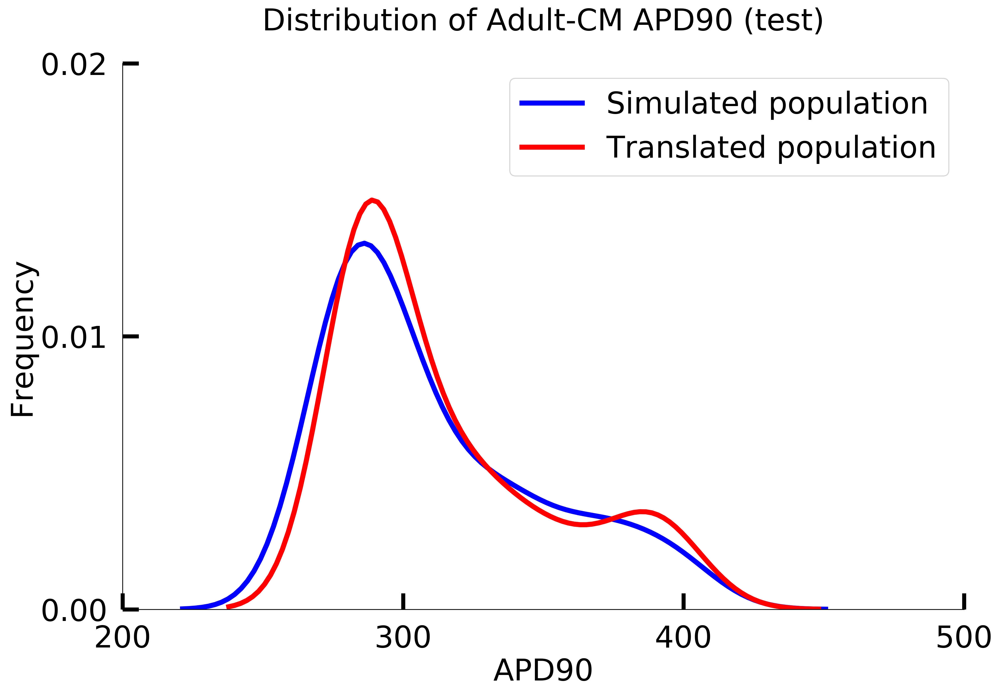

In [27]:
dist_test_real=pd.read_csv(path_save+"APD90_real_test.csv",header=None)
dist_test_predict=pd.read_csv(path_save+"APD90_predict_test.csv",header=None)
dist_test_real=dist_test_real.iloc[:, 1].values
dist_test_predict=dist_test_predict.iloc[:, 1].values

plt.figure(num=None, figsize=(15, 10), dpi=300)

rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)

plt.xlim(200, 500) 
plt.ylim(0, 0.02)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,501, step=100),fontsize=30) 
plt.yticks(np.arange(0,0.021, step=0.01),fontsize=30)

# plt.xticks(np.arange(240,321, step=20),fontsize=25) 
# plt.yticks(np.arange(0,0.051, step=0.01),fontsize=25)  
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
sns.kdeplot(dist_test_real, color='b',linewidth=5, label="Simulated population")
sns.kdeplot(dist_test_predict, color='r',linewidth=5, label="Translated population")

plt.xlabel("APD90",fontsize=30)
plt.ylabel("Frequency",fontsize=30)
ttl=plt.title("Distribution of Adult-CM APD90 (test)",fontsize=30)
ttl.set_position([.5, 1.05])
plt.legend(loc = 'best', prop={'size': 30})
plt.savefig(path_save+"test_dist_APD90.eps", dpi = 300, bbox_inches = 'tight')

50% block

In [60]:
Data_50_block = pd.read_csv("C:/Users/Parya/Desktop/data/LSTM_paper/final/50per_block.csv",header=None)
Data_50_block = Data_50_block.iloc[:, :].values
input_50 = Data_50_block-Input_mean
input_50 = input_50/Input_max

input_50=Variable(torch.from_numpy(input_50).float())
input_50 = input_50.unsqueeze_(-1)
input_50 = input_50.cuda()


# APD90

predictions_50_1, predictions_50_2  = model(input_50)
# pred_plot_50_1 = predictions_50_2.cpu().data.numpy()
pred_plot_50 = pred_plot_50.reshape(4,701)
pred_plot_50 = predictions_50_2.cpu().data.numpy()
pred_plot_503=pd.DataFrame(pred_plot_50)
# pred_plot_50.to_csv(path_save+"pred_plot_50.csv",header=None)
# APD90_50_pred=[]
# for i in range(len(pred_plot_50)):
#     mai = pred_plot_50[i,7]
#     mii = pred_plot_50[i,700]
#     l=mai-(0.9*(mai-mii))
#     t=find_nearest(pred_plot_50[i], l)
#     p=np.where(pred_plot_50[i]==t)
#     APD90_50_pred.append(p[0])
    
# APD90_50_pred2=pd.DataFrame(APD90_50_pred)
# APD90_50_pred2.to_csv(path_save+"APD90_50.csv",header=None)

ValueError: Must pass 2-d input

#### Expeimental data

In [74]:
Data_exp = pd.read_csv("C:/Users/Parya/Desktop/data/LSTM_paper/final/exp_data.csv",header=None)
Data_exp = Data_exp.iloc[:, :].values
input_exp = Data_exp-Input_mean
input_exp = input_exp/Input_max

input_exp=Variable(torch.from_numpy(input_exp).float())
input_exp = input_exp.unsqueeze_(-1)
input_exp = input_exp.cuda()


# APD90

predictions_exp_1, predictions_exp_2  = model(input_50)
pred_plot_exp = predictions_exp_2.cpu().data.numpy()
pred_exp_classification = F.softmax(predictions_exp_1)
pred_exp_classification = pred_exp_classification.data >= 0.5
train_pred_exp_classification = pred_exp_classification[:,1].cpu().data.numpy().astype(int)

pred_plot_exp = pred_plot_exp.reshape((pred_plot_exp.shape[0], pred_plot_exp.shape[1] ))
pred_plot_exp=(pred_plot_exp*y_reg_max)+y_reg_mean

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:15: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  from ipykernel import kernelapp as app


In [88]:
a

50

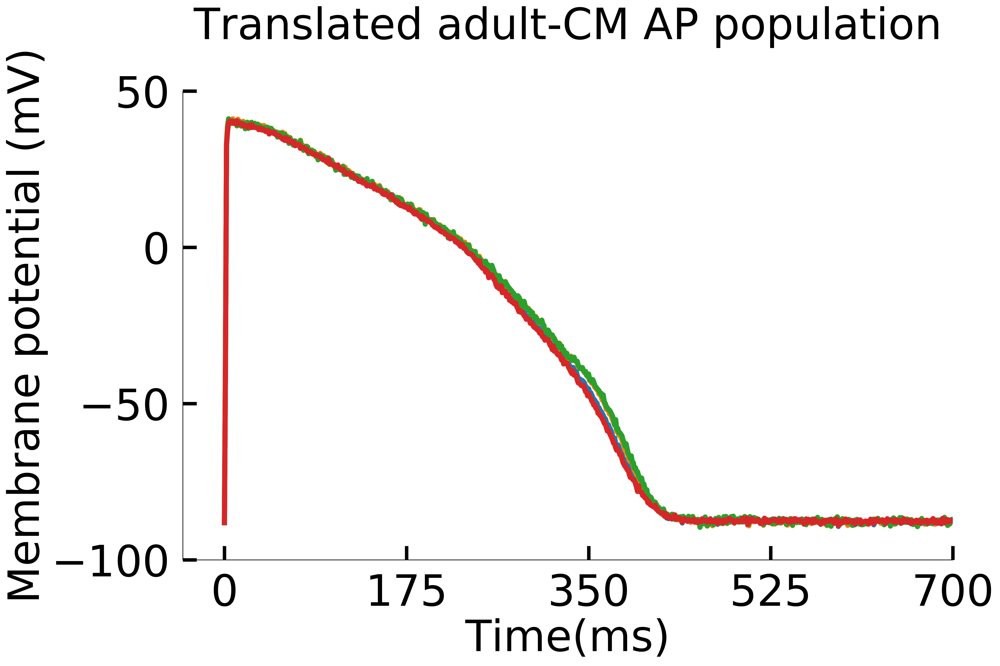

In [91]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(pred_plot_exp.transpose(),linewidth=6)
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
ttl=plt.title("Translated adult-CM AP population",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/Figures_26Jun20/Fig7/fig12.pdf", dpi = 300, bbox_inches = 'tight')

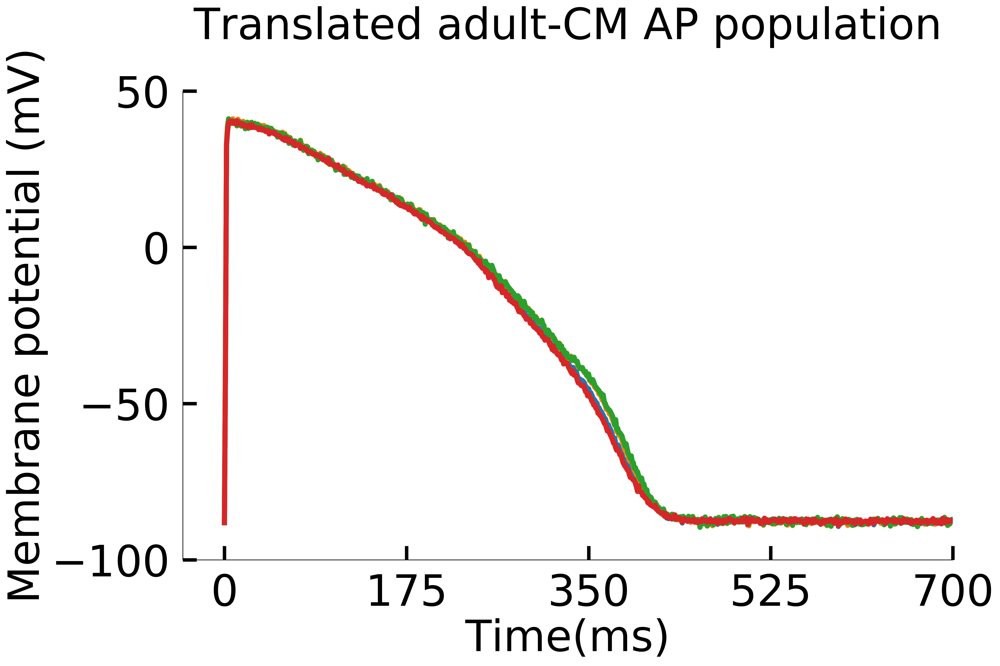

In [89]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=50) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

ax.plot(pred_plot_exp.transpose(),linewidth=6)
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
ttl = plt.title("Translated adult-CM AP population",fontsize=50)
ttl.set_position([.5, 1.1])

fig.savefig('D:/Papers/LSTM encoder_decoder/figures/Figures_26Jun20/Fig7/fig123.pdf', dpi = 300, bbox_inches = 'tight')

# Compare normal vs block distribution

# Normal

In [28]:
target_adult_normal = pd.read_csv(path_read+"target_normal_without_noise_final.csv",header=None)
target_adult_normal=target_adult_normal.iloc[:, :].values

input_iPSC_normal = pd.read_csv(path_read+"input_normal_without_noise_final.csv",header=None)
input_iPSC_normal=input_iPSC_normal.iloc[:, :].values

input_iPSC_normal_remove_mean=input_iPSC_normal-Input_mean
input_normal=input_iPSC_normal_remove_mean/Input_max

input_normal=Variable(torch.from_numpy(input_normal).float())
input_normal = input_normal.unsqueeze_(-1)
input_normal = input_normal.cuda()


# APD90

predictions_normal1, predictions_normal2  = model(input_normal)
pred_plot_normal = predictions_normal2.cpu().data.numpy()


APD90_normal_real=[]
for i in range(len(target_adult_normal)):
    mai = target_adult_normal[i,7]
    mii = target_adult_normal[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(target_adult_normal[i], l)
    p=np.where(target_adult_normal[i]==t)
    APD90_normal_real.append(p[0])
    
APD90_normal_real2=pd.DataFrame(APD90_normal_real)
APD90_normal_real2.to_csv(path_save+"APD90_real_normal.csv",header=None)


    
APD90_normal_pred=[]
for i in range(len(pred_plot_normal)):
    mai = pred_plot_normal[i,7]
    mii = pred_plot_normal[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(pred_plot_normal[i], l)
    p=np.where(pred_plot_normal[i]==t)
    APD90_normal_pred.append(p[0])
    
APD90_normal_pred2=pd.DataFrame(APD90_normal_pred)
APD90_normal_pred2.to_csv(path_save+"APD90_pred_normal.csv",header=None)

    
Error=[]    
for i in range(len(pred_plot_normal)):
    e=100*abs((np.array(APD90_normal_pred[i])-np.array(APD90_normal_real[i]))/np.array(APD90_normal_real[i]))
    Error.append(e)
    
mean_APD90_error_normal= np.mean(np.array(Error))
print("Error APD90 normal:" , mean_APD90_error_normal)

Error APD90 normal: 2.72779520207233


c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


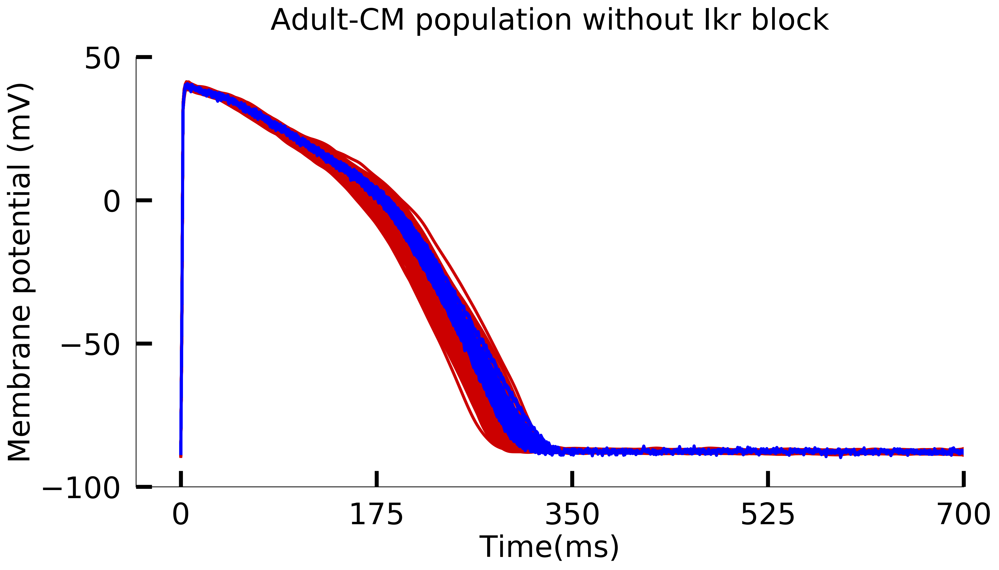

In [29]:
pred_plot_normal = pred_plot_normal.reshape((pred_plot_normal.shape[0], pred_plot_normal.shape[1] ))
pred_plot_normal=(pred_plot_normal*y_reg_max)+y_reg_mean

#figure properties

fig=plt.figure(num=None, figsize=(15, 8), dpi=300)


rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=30) 
plt.yticks(np.arange(-100,51, step=50),fontsize=30)
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
ax.plot(target_adult_normal.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')

ax.plot(pred_plot_normal.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
handles, labels = ax.get_legend_handles_labels()
display = (0,400)

plt.xlabel("Time(ms)",fontsize=30)
plt.ylabel("Membrane potential (mV)",fontsize=30)
# plt.legend(loc='best', prop={'size': 18, 'weight':'bold' })
# ax.legend([handle for i,handle in enumerate(handles) if i in display],
#       [label for i,label in enumerate(labels) if i in display], loc = 'best', prop={'size': 30})
ttl = plt.title("Adult-CM population without Ikr block",fontsize=30)
ttl.set_position([.5, 1.05])

fig.savefig(path_save+'translator_output_normal.eps', dpi = 300, bbox_inches = 'tight')

# Block

In [30]:
target_adult_block = pd.read_csv(path_read+"target_block_without_noise_final.csv",header=None)
target_adult_block=target_adult_block.iloc[:, :].values

input_iPSC_block = pd.read_csv(path_read+"input_block_without_noise_final.csv",header=None)
input_iPSC_block=input_iPSC_block.iloc[:, :].values

input_iPSC_block_remove_mean=input_iPSC_block-Input_mean
input_block=input_iPSC_block_remove_mean/Input_max

input_block=Variable(torch.from_numpy(input_block).float())
input_block = input_block.unsqueeze_(-1)
input_block = input_block.cuda()

predictions_block1, predictions_block2  = model(input_block)
pred_plot_block = predictions_block2.cpu().data.numpy()


APD90_block_real=[]
for i in range(len(target_adult_block)):
    mai = target_adult_block[i,7]
    mii = target_adult_block[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(target_adult_block[i], l)
    p=np.where(target_adult_block[i]==t)
    APD90_block_real.append(p[0])
    
APD90_block_real2=pd.DataFrame(APD90_block_real)
APD90_block_real2.to_csv(path_save+"APD90_real_block.csv",header=None)


    
APD90_block_pred=[]
for i in range(len(pred_plot_block)):
    mai = pred_plot_block[i,7]
    mii = pred_plot_block[i,700]
    l=mai-(0.9*(mai-mii))
    t=find_nearest(pred_plot_block[i], l)
    p=np.where(pred_plot_block[i]==t)
    APD90_block_pred.append(p[0])
    
APD90_block_pred2=pd.DataFrame(APD90_block_pred)
APD90_block_pred2.to_csv(path_save+"APD90_pred_block.csv",header=None)

    
Error=[]    
for i in range(len(pred_plot_block)):
    e=100*abs((np.array(APD90_block_pred[i])-np.array(APD90_block_real[i]))/np.array(APD90_block_real[i]))
    Error.append(e)
    
mean_APD90_error_block= np.mean(np.array(Error))
print("Error APD90 block:" , mean_APD90_error_block)

Error APD90 block: 3.258318189837139


c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  from ipykernel import kernelapp as app


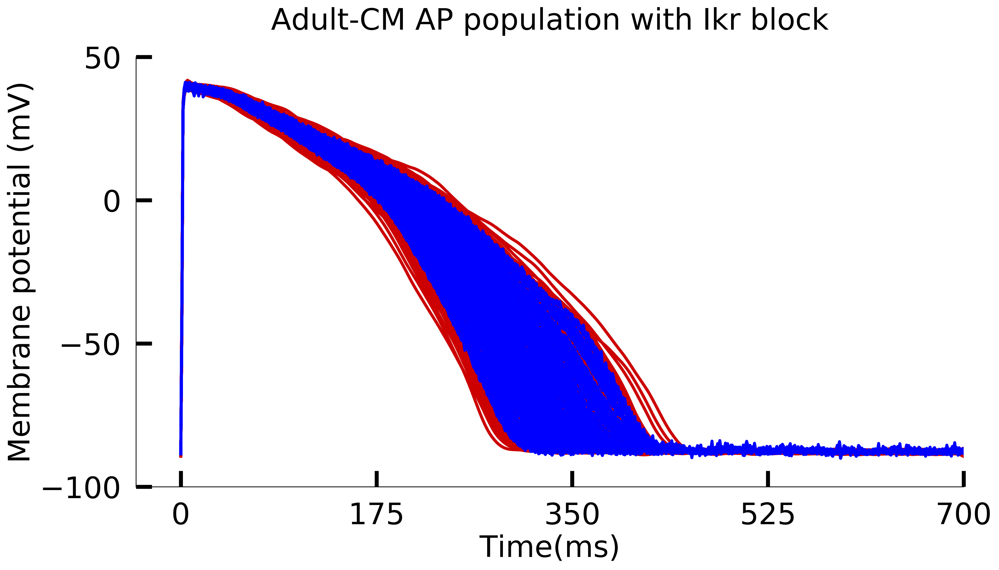

In [31]:
pred_plot_block = pred_plot_block.reshape((pred_plot_block.shape[0], pred_plot_block.shape[1] ))
pred_plot_block=(pred_plot_block*y_reg_max)+y_reg_mean

#figure properties

fig=plt.figure(num=None, figsize=(15, 8), dpi=300)


rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=30) 
plt.yticks(np.arange(-100,51, step=50),fontsize=30)
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
ax.plot(target_adult_block.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')

ax.plot(pred_plot_block.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
handles, labels = ax.get_legend_handles_labels()
display = (0,400)

plt.xlabel("Time(ms)",fontsize=30)
plt.ylabel("Membrane potential (mV)",fontsize=30)
# plt.legend(loc='best', prop={'size': 18, 'weight':'bold' })
# ax.legend([handle for i,handle in enumerate(handles) if i in display],
#       [label for i,label in enumerate(labels) if i in display], loc = 'best', prop={'size': 30})
ttl = plt.title("Adult-CM AP population with Ikr block",fontsize=30)
ttl.set_position([.5, 1.05])

fig.savefig(path_save+'translator_output_block.eps', dpi = 300, bbox_inches = 'tight')

# Distribution normal

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


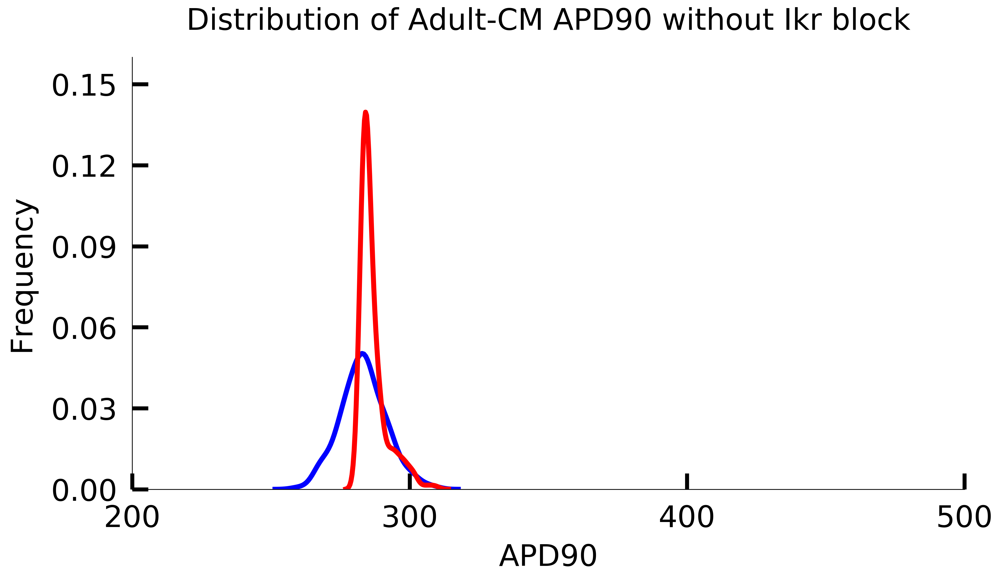

In [32]:
dist_normal_real=pd.read_csv(path_save+"APD90_real_normal.csv",header=None)
dist_normal_predict=pd.read_csv(path_save+"APD90_pred_normal.csv",header=None)
dist_normal_real=dist_normal_real.iloc[:, 1].values
dist_normal_predict=dist_normal_predict.iloc[:, 1].values

plt.figure(num=None, figsize=(15, 8), dpi=300)

rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)

plt.xlim(200, 500) 
plt.ylim(0, 0.16)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,501, step=100),fontsize=30) 
plt.yticks(np.arange(0,0.161, step=0.03),fontsize=30)

# plt.xticks(np.arange(240,321, step=20),fontsize=25) 
# plt.yticks(np.arange(0,0.051, step=0.01),fontsize=25)  
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
sns.kdeplot(dist_normal_real, color='b',linewidth=5, label="Simulated population", legend=False)
sns.kdeplot(dist_normal_predict, color='r',linewidth=5, label="Translated population", legend=False)

plt.xlabel("APD90",fontsize=30,labelpad=10)
plt.ylabel("Frequency",fontsize=30,labelpad=15)
ttl=plt.title("Distribution of Adult-CM APD90 without Ikr block",fontsize=30)
ttl.set_position([.5, 1.05])
# plt.legend(loc = 'best', prop={'size': 30})
plt.savefig(path_save+"Normal_APD90.eps", dpi = 300, bbox_inches = 'tight')

# Distribution block

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


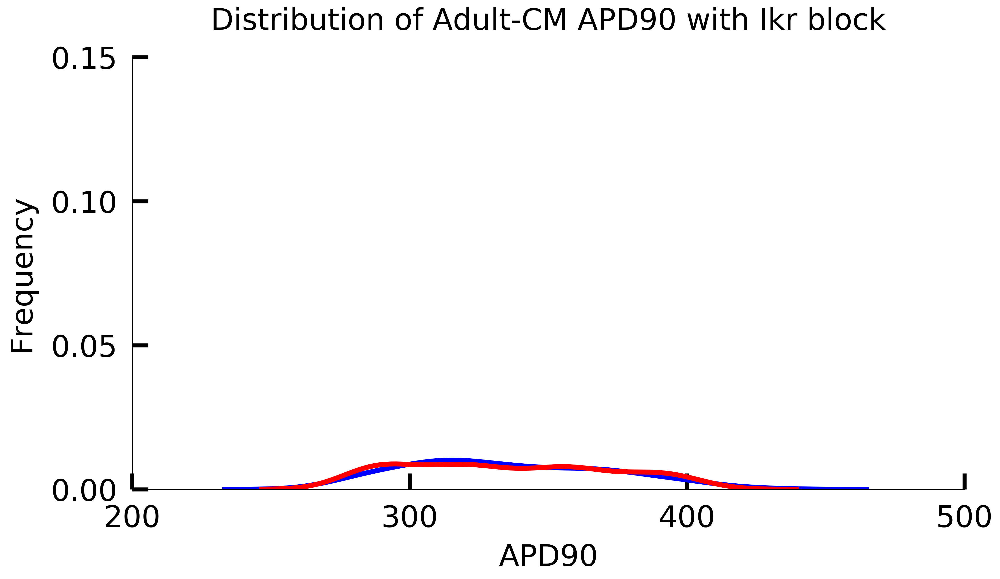

In [33]:
dist_block_real=pd.read_csv(path_save+"APD90_real_block.csv",header=None)
dist_block_predict=pd.read_csv(path_save+"APD90_pred_block.csv",header=None)
dist_block_real=dist_block_real.iloc[:, 1].values
dist_block_predict=dist_block_predict.iloc[:, 1].values

plt.figure(num=None, figsize=(15, 8), dpi=300)

rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax = plt.subplot(111)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)

plt.xlim(200, 500) 
plt.ylim(0, 0.15)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,501, step=100),fontsize=30) 
plt.yticks(np.arange(0,0.151, step=0.05),fontsize=30)

# plt.xticks(np.arange(240,321, step=20),fontsize=25) 
# plt.yticks(np.arange(0,0.051, step=0.01),fontsize=25)  
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
sns.kdeplot(dist_block_real, color='b',linewidth=5, label="Simulated population", legend=False)
sns.kdeplot(dist_block_predict, color='r',linewidth=5, label="Translated population", legend=False)

plt.xlabel("APD90",fontsize=30,labelpad=10)
plt.ylabel("Frequency",fontsize=30,labelpad=15)

ttl=plt.title("Distribution of Adult-CM APD90 with Ikr block",fontsize=30)
ttl.set_position([.5, 1.05])
# plt.legend(loc = 'best', prop={'size': 30})
plt.savefig(path_save+"Block_APD90.eps", dpi = 300, bbox_inches = 'tight')

In [92]:
mean_APD90_error_train

NameError: name 'mean_APD90_error_train' is not defined

In [34]:
print('Classification evaluation for:',"learning rate= ", lr, "LSTM hidden dim: ", hidden_dim, 
      "Num of fully connected layer:", 1
     , "neurons first layer: ", output_dim1,  "neurons second layer:", output_dim2, "Epochs: ", num_epochs)

acc_train=accuracy_score(train_real_classification, train_pred_classification)
acc_test=accuracy_score(test_real_classification, test_pred_classification)
print('Classification Accuracy train set:', '%.2f'%acc_train , 'Classification Accuracy test set:', '%.2f'%acc_test)
target_names=['Class1', 'Class2' ]

print("Classifier training performance:")
print(classification_report(train_real_classification, train_pred_classification, target_names=target_names))

print("Classifier test performance:")
print(classification_report(test_real_classification, test_pred_classification, target_names=target_names))


print('Translation evaluation for:',"learning rate= ", lr)
print('MSE train set:', train_mse , 'MSE test set:', test_mse)
print('R2_score train set:', train_R2_score , 'R2_score test set:', test_R2_score)

print("Error APD90 normal:" , mean_APD90_error_normal, "Error APD90 block:" , mean_APD90_error_block)

Classification evaluation for: learning rate=  1.5625e-05 LSTM hidden dim:  2 Num of fully connected layer: 1 neurons first layer:  40 neurons second layer: 10 Epochs:  300
Classification Accuracy train set: 0.93 Classification Accuracy test set: 0.99
Classifier training performance:
              precision    recall  f1-score   support

      Class1       0.86      0.91      0.89        34
      Class2       0.96      0.93      0.95        76

   micro avg       0.93      0.93      0.93       110
   macro avg       0.91      0.92      0.92       110
weighted avg       0.93      0.93      0.93       110

Classifier test performance:
              precision    recall  f1-score   support

      Class1       0.96      1.00      0.98        24
      Class2       1.00      0.99      0.99        68

   micro avg       0.99      0.99      0.99        92
   macro avg       0.98      0.99      0.99        92
weighted avg       0.99      0.99      0.99        92

Translation evaluation for: lear

In [35]:
# skplt.metrics.plot_confusion_matrix(train_real_classification, train_pred_classification, normalize=True)
# plt.savefig(path_save+"CM_train.eps", dpi = 300, bbox_inches = 'tight')

In [36]:
# skplt.metrics.plot_confusion_matrix(test_real_classification, test_pred_classification, normalize=True)
# plt.savefig(path_save+"CM_test.eps", dpi = 300, bbox_inches = 'tight')

In [37]:
x_train_plot=(x_train*Input_max)+Input_mean
x_test_plot =(x_test*Input_max)+Input_mean
a=50

Plots

c:\users\parya\py36\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


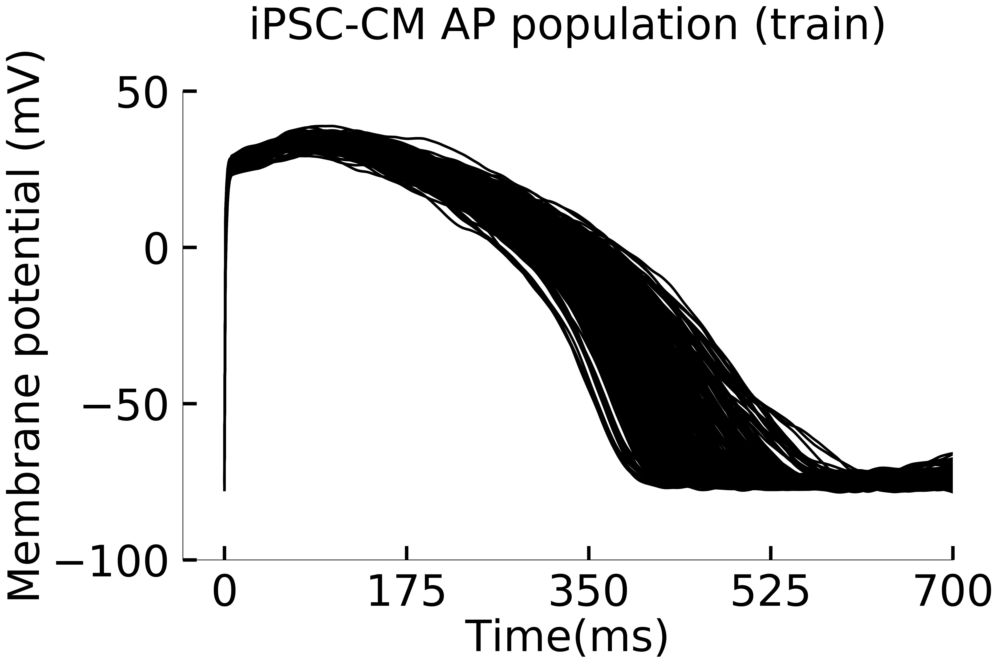

In [38]:
plt.figure(num=None, figsize=(16, 10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax = plt.subplot(111) 
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=a) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(x_train_plot.transpose(),linewidth=3,color=[0,0,0])
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
ttl=plt.title("iPSC-CM AP population (train)",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig11.png", dpi = 300, bbox_inches = 'tight')

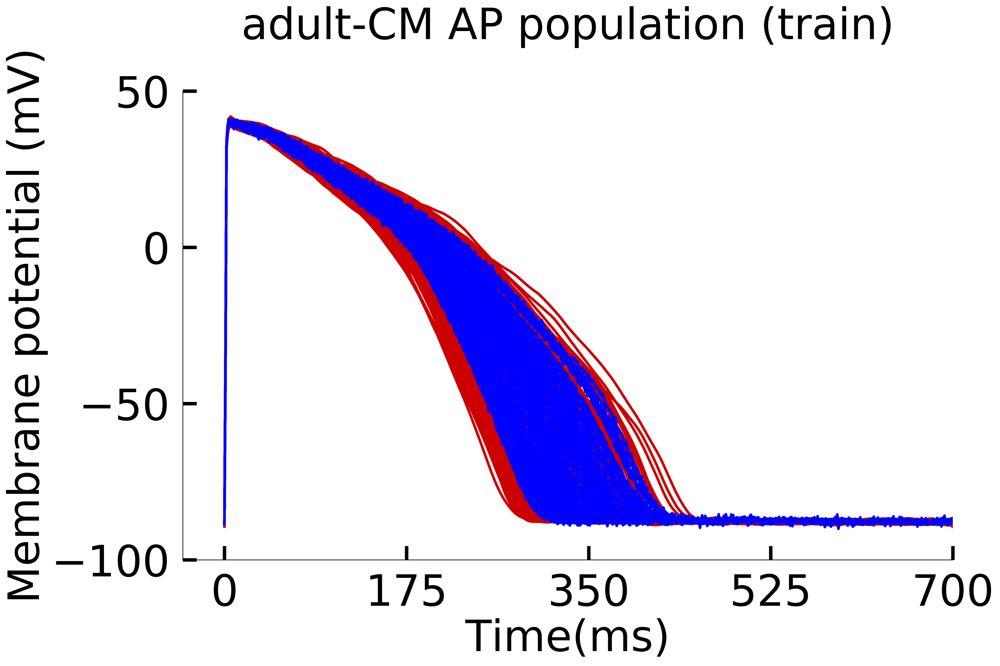

In [39]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=a) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(y_train_plot.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')
plt.plot(pred_plot_train.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
handles, labels = ax.get_legend_handles_labels()
display = (0,400)
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
ttl=plt.title("adult-CM AP population (train)",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig12.png", dpi = 300, bbox_inches = 'tight')

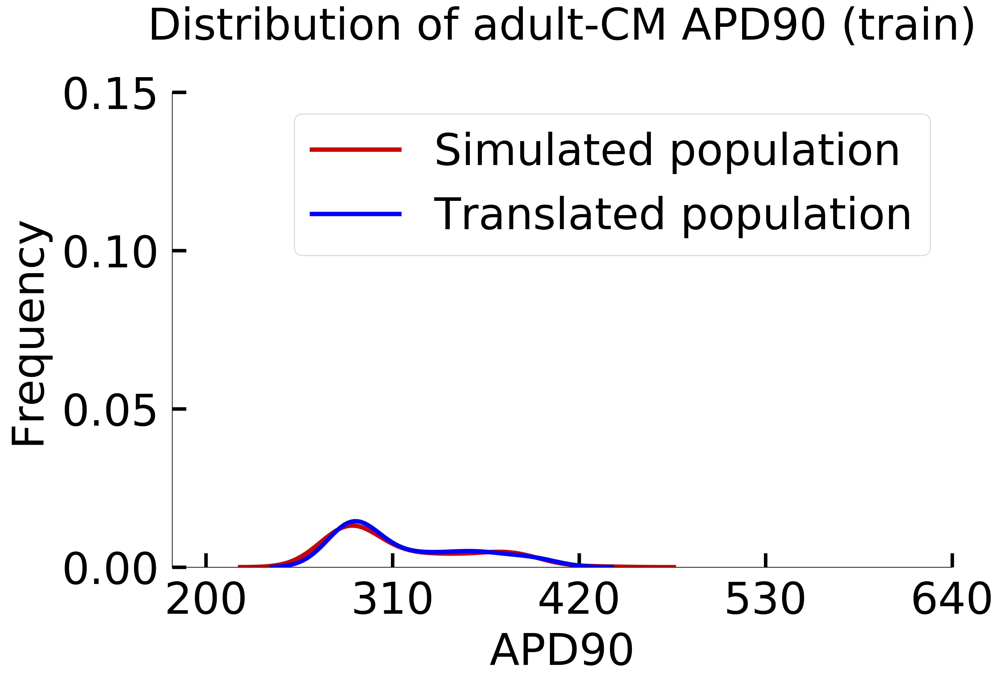

In [40]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)

plt.xlim(180, 640) 
plt.ylim(0, 0.15)
 
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,641, step=110),fontsize=a) 
plt.yticks(np.arange(0,0.151, step=0.05),fontsize=a)

sns.kdeplot(dist_train_real, color=[0.8,0,0],linewidth=5, label="Simulated population", legend=False)
sns.kdeplot(dist_train_predict, color=[0,0,1],linewidth=5, label="Translated population", legend=False)
plt.legend(loc = 'best', prop={'size': a})
plt.xlabel("APD90",fontsize=a,labelpad=10)
plt.ylabel("Frequency",fontsize=a,labelpad=15)
ttl=plt.title("Distribution of adult-CM APD90 (train)",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig13.png", dpi = 300, bbox_inches = 'tight')

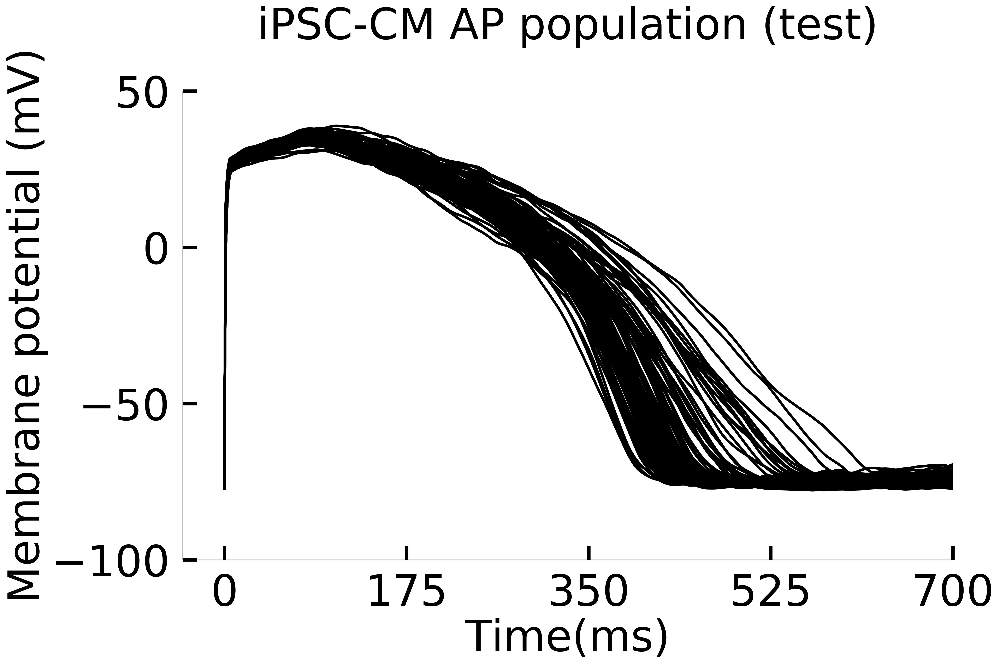

In [41]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=a) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(x_test_plot.transpose(),linewidth=3,color=[0,0,0])
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
ttl=plt.title("iPSC-CM AP population (test)",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig21.png", dpi = 300, bbox_inches = 'tight')

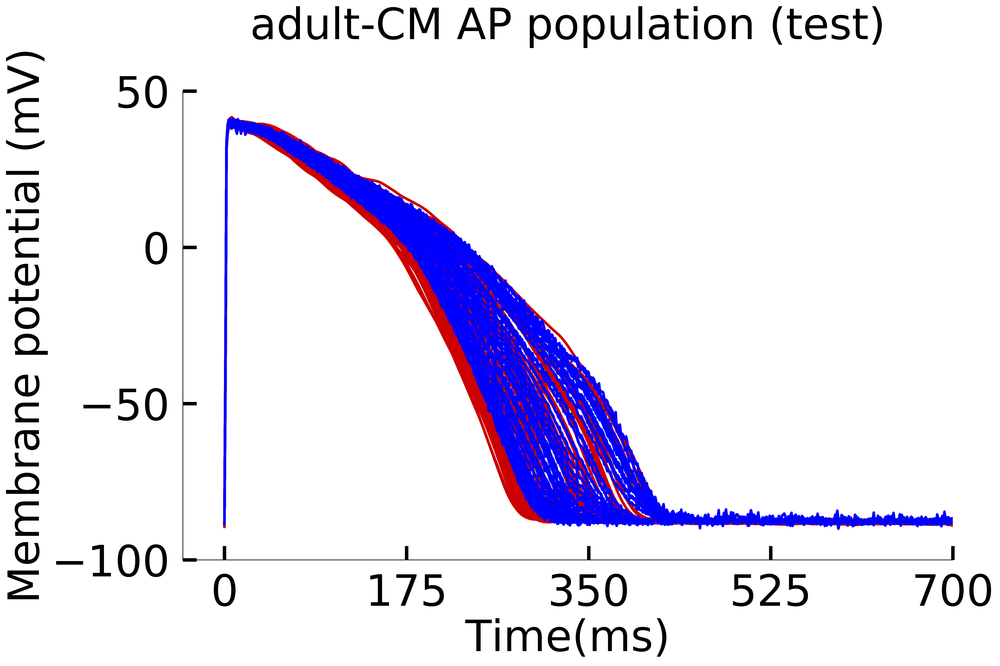

In [42]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=a) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(y_test_plot.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')
plt.plot(pred_plot_test.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
handles, labels = ax.get_legend_handles_labels()
display = (0,400)
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
ttl=plt.title("adult-CM AP population (test)",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig22.png", dpi = 300, bbox_inches = 'tight')

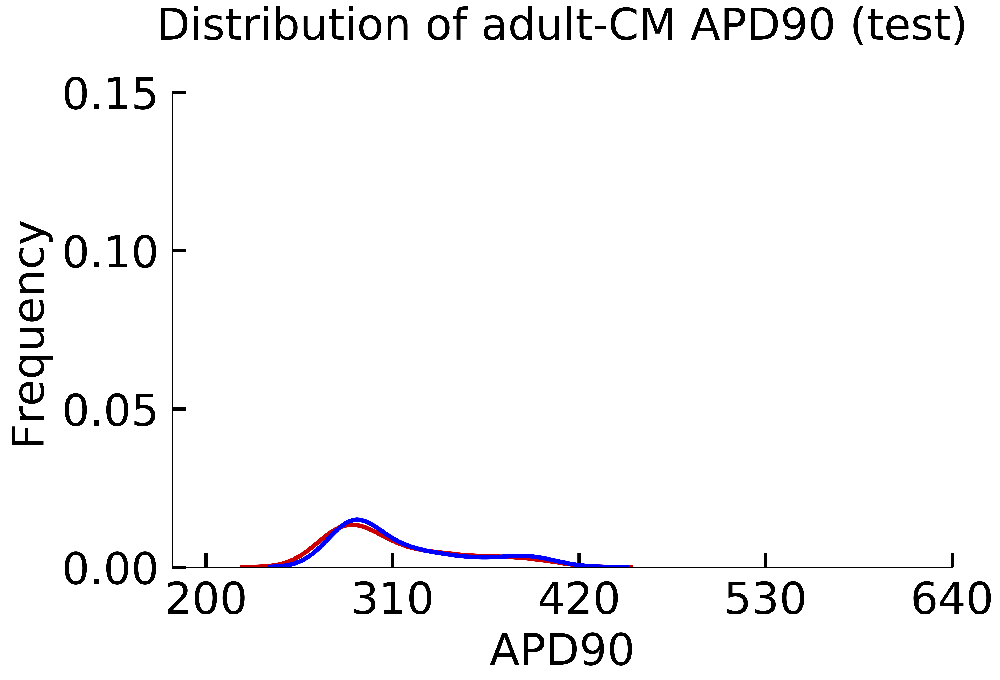

In [43]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)

plt.xlim(180, 640) 
plt.ylim(0, 0.15)
 
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,641, step=110),fontsize=a) 
plt.yticks(np.arange(0,0.151, step=0.05),fontsize=a)

sns.kdeplot(dist_test_real, color=[0.8,0,0],linewidth=5, label="Simulated population", legend=False)
sns.kdeplot(dist_test_predict, color=[0,0,1],linewidth=5, label="Translated population", legend=False)
# plt.legend(loc = 'best', prop={'size': 50})
plt.xlabel("APD90",fontsize=a,labelpad=10)
plt.ylabel("Frequency",fontsize=a,labelpad=15)
ttl=plt.title("Distribution of adult-CM APD90 (test)",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig23.png", dpi = 300, bbox_inches = 'tight')

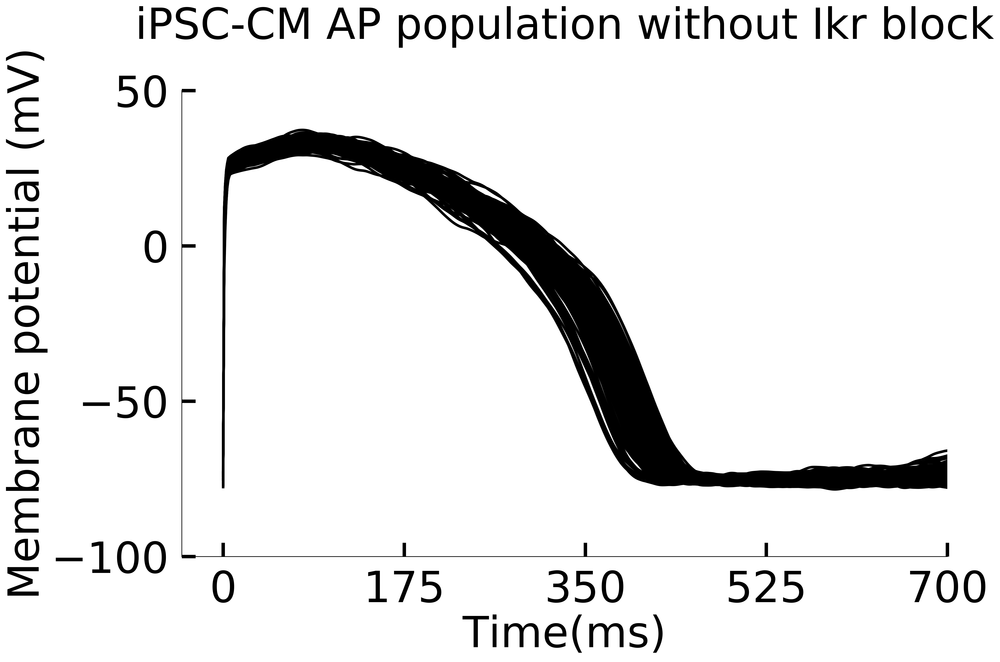

In [44]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=a) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(input_iPSC_normal.transpose(),linewidth=3,color=[0,0,0])
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
ttl=plt.title("iPSC-CM AP population without Ikr block",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig31.png", dpi = 300, bbox_inches = 'tight')

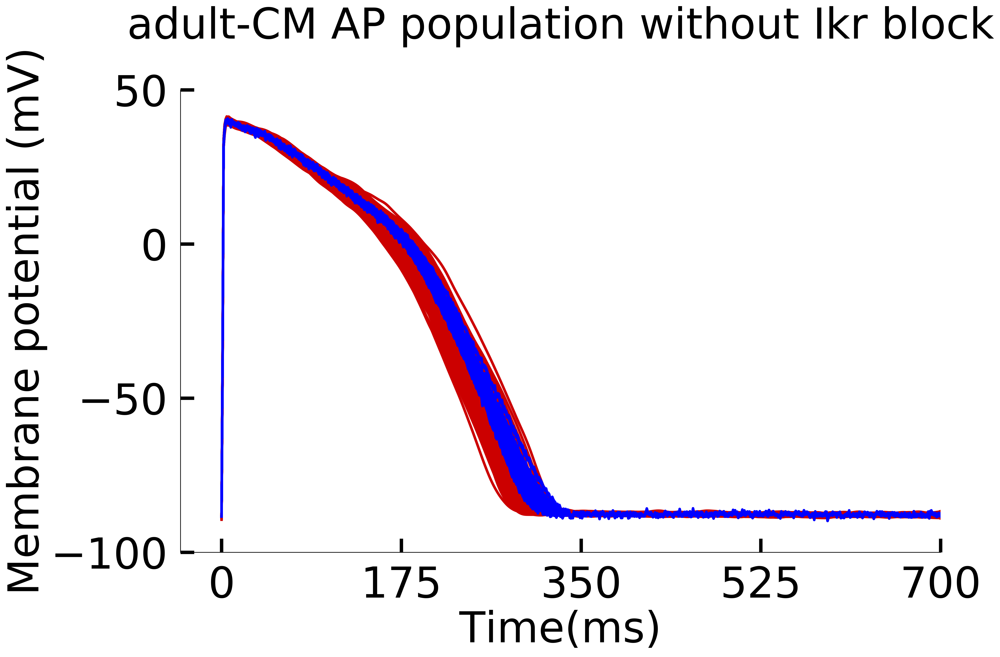

In [45]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=a) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(target_adult_normal.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')
plt.plot(pred_plot_normal.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
handles, labels = ax.get_legend_handles_labels()
display = (0,400)
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
# plt.legend(loc='best', prop={'size': 18, 'weight':'bold' })
# ax.legend([handle for i,handle in enumerate(handles) if i in display],
#       [label for i,label in enumerate(labels) if i in display], loc = 'best', prop={'size': 30})
ttl = plt.title("adult-CM AP population without Ikr block",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig32.png", dpi = 300, bbox_inches = 'tight')

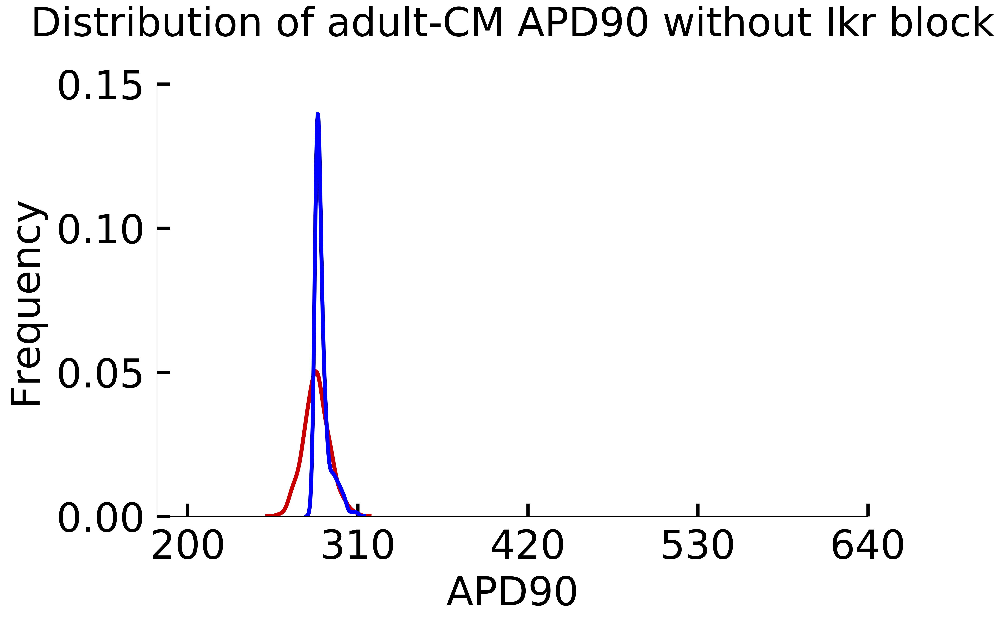

In [46]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)

plt.xlim(180, 640) 
plt.ylim(0, 0.15)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,641, step=110),fontsize=a) 
plt.yticks(np.arange(0,0.151, step=0.05),fontsize=a)

# plt.xticks(np.arange(240,321, step=20),fontsize=25) 
# plt.yticks(np.arange(0,0.051, step=0.01),fontsize=25)  
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
sns.kdeplot(dist_normal_real, color=[0.8,0,0],linewidth=5, label="Simulated population", legend=False)
sns.kdeplot(dist_normal_predict, color=[0,0,1],linewidth=5, label="Translated population", legend=False)
# plt.legend(loc = 'best', prop={'size': 50})
plt.xlabel("APD90",fontsize=a,labelpad=10)
plt.ylabel("Frequency",fontsize=a,labelpad=15)
ttl=plt.title("Distribution of adult-CM APD90 without Ikr block",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig33.png", dpi = 300, bbox_inches = 'tight')

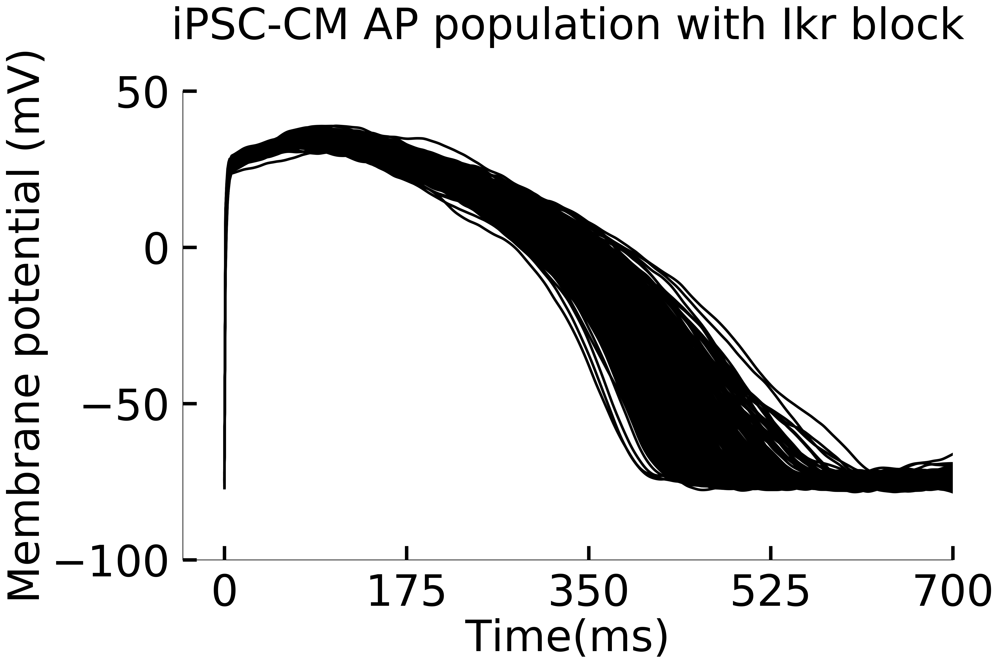

In [47]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)  
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  
plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)  
plt.xticks(np.arange(0,701, step=175),fontsize=a) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  
plt.plot(input_iPSC_block.transpose(),linewidth=3,color=[0,0,0])
plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
ttl=plt.title("iPSC-CM AP population with Ikr block",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig41.png", dpi = 300, bbox_inches = 'tight')

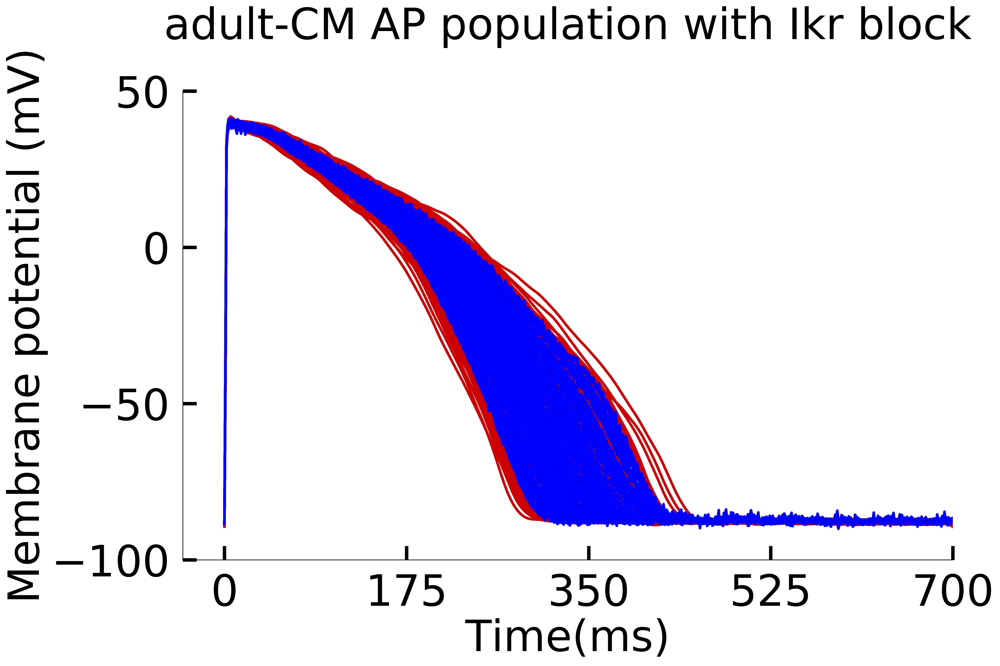

In [48]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4) 
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)  

plt.ylim(-100, 50,50) 
plt.xlim(-40, 700)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(0,701, step=175),fontsize=a) 
plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
ax.plot(target_adult_block.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')

ax.plot(pred_plot_block.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
handles, labels = ax.get_legend_handles_labels()
display = (0,400)

plt.xlabel("Time(ms)",fontsize=a)
plt.ylabel("Membrane potential (mV)",fontsize=a)
# plt.legend(loc='best', prop={'size': 18, 'weight':'bold' })
# ax.legend([handle for i,handle in enumerate(handles) if i in display],
#       [label for i,label in enumerate(labels) if i in display], loc = 'best', prop={'size': 30})
ttl = plt.title("adult-CM AP population with Ikr block",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig42.png", dpi = 300, bbox_inches = 'tight')

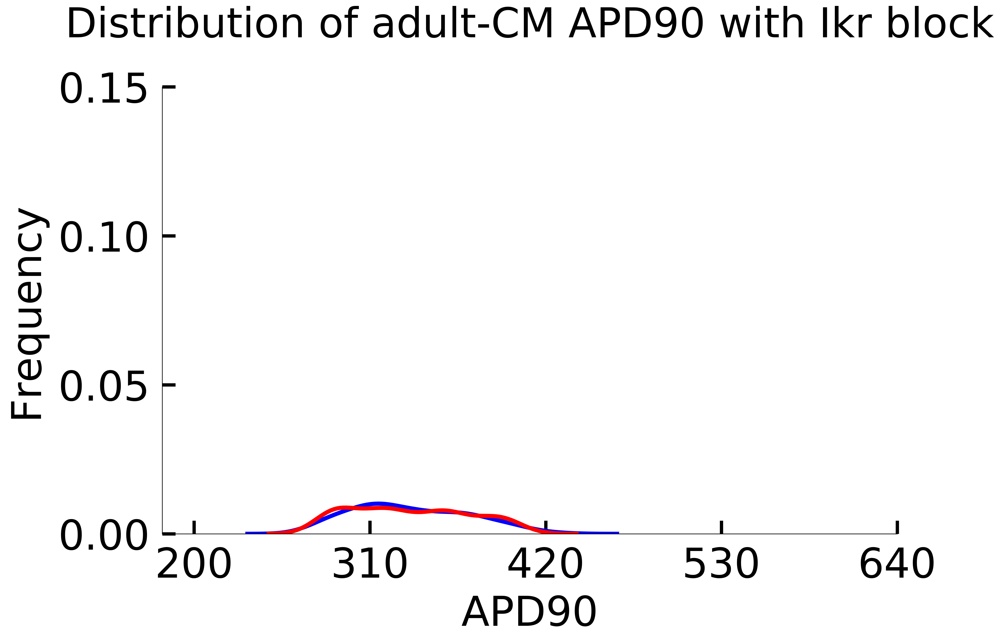

In [49]:
plt.figure(num=None, figsize=(16,10), dpi=300)
rc('axes', linewidth=4)
ax = plt.gca()
ax.tick_params(axis='both', which='major', pad=15)
ax.tick_params(axis="y",direction="in", length=16, width=4)
ax.tick_params(axis="x",direction="in", length=16, width=4)

ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)

plt.xlim(180, 640) 
plt.ylim(0, 0.15)
# Ensure that the axis ticks only show up on the bottom and left of the plot.  
# Ticks on the right and top of the plot are generally unnecessary chartjunk.  
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().tick_left()  

plt.xticks(np.arange(200,641, step=110),fontsize=a) 
plt.yticks(np.arange(0,0.151, step=0.05),fontsize=a)

# plt.xticks(np.arange(240,321, step=20),fontsize=25) 
# plt.yticks(np.arange(0,0.051, step=0.01),fontsize=25)  
# Limit the range of the plot to only where the data is.  
# Avoid unnecessary whitespace.  
# plt.ylim(63, 85)  
#Training data
sns.kdeplot(dist_block_real, color='b',linewidth=5, label="Simulated population", legend=False)
sns.kdeplot(dist_block_predict, color='r',linewidth=5, label="Translated population", legend=False)

plt.xlabel("APD90",fontsize=a,labelpad=10)
plt.ylabel("Frequency",fontsize=a,labelpad=15)

ttl=plt.title("Distribution of adult-CM APD90 with Ikr block",fontsize=a)
ttl.set_position([.5, 1.1])
plt.savefig("D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig8/fig43.png", dpi = 300, bbox_inches = 'tight')

In [50]:
# fig = plt.figure(num=None, figsize=(80, 100), dpi=300)

# #train

# fig.add_subplot(4, 3, 1)

# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)  
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)  
# plt.ylim(-100, 50,50) 
# plt.xlim(-40, 700)  
# plt.xticks(np.arange(0,701, step=175),fontsize=a) 
# plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  
# plt.plot(x_train_plot.transpose(),linewidth=3,color=[0,0,0])
# plt.xlabel("Time(ms)",fontsize=a)
# plt.ylabel("Membrane potential (mV)",fontsize=a)
# ttl=plt.title("iPSC-CM AP population (train)",fontsize=a)
# ttl.set_position([.5, 1.05])

# fig.add_subplot(4, 3, 2)

# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)  
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)  
# plt.ylim(-100, 50,50) 
# plt.xlim(-40, 700)  
# plt.xticks(np.arange(0,701, step=175),fontsize=a) 
# plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  
# plt.plot(y_train_plot.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')
# plt.plot(pred_plot_train.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
# handles, labels = ax.get_legend_handles_labels()
# display = (0,400)
# plt.xlabel("Time(ms)",fontsize=a)
# plt.ylabel("Membrane potential (mV)",fontsize=a)
# ttl=plt.title("adult-CM AP population (train)",fontsize=a)
# ttl.set_position([.5, 1.05])

# #APD90 without block
# fig.add_subplot(4, 3, 3)
# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)

# plt.xlim(200, 500) 
# plt.ylim(0, 0.15)
 
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  

# plt.xticks(np.arange(200,501, step=100),fontsize=a) 
# plt.yticks(np.arange(0,0.151, step=0.05),fontsize=a)

# sns.kdeplot(dist_train_real, color=[0.8,0,0],linewidth=5, label="Simulated population", legend=False)
# sns.kdeplot(dist_train_predict, color=[0,0,1],linewidth=5, label="Translated population", legend=False)
# plt.legend(loc = 'best', prop={'size': a})
# plt.xlabel("APD90",fontsize=a,labelpad=10)
# plt.ylabel("Frequency",fontsize=a,labelpad=15)
# ttl=plt.title("Distribution of adult-CM APD90 (train)",fontsize=a)
# ttl.set_position([.5, 1.05])

# #test

# fig.add_subplot(4, 3, 4)

# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)  
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)  
# plt.ylim(-100, 50,50) 
# plt.xlim(-40, 700)  
# plt.xticks(np.arange(0,701, step=175),fontsize=a) 
# plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  
# plt.plot(x_test_plot.transpose(),linewidth=3,color=[0,0,0])
# plt.xlabel("Time(ms)",fontsize=a)
# plt.ylabel("Membrane potential (mV)",fontsize=a)
# ttl=plt.title("iPSC-CM AP population (test)",fontsize=a)
# ttl.set_position([.5, 1.05])

# fig.add_subplot(4, 3, 5)

# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)  
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)  
# plt.ylim(-100, 50,50) 
# plt.xlim(-40, 700)  
# plt.xticks(np.arange(0,701, step=175),fontsize=a) 
# plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  
# plt.plot(y_test_plot.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')
# plt.plot(pred_plot_test.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
# handles, labels = ax.get_legend_handles_labels()
# display = (0,400)
# plt.xlabel("Time(ms)",fontsize=a)
# plt.ylabel("Membrane potential (mV)",fontsize=a)
# ttl=plt.title("adult-CM AP population (test)",fontsize=a)
# ttl.set_position([.5, 1.05])

# #APD90 without block
# fig.add_subplot(4, 3, 6)
# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)

# plt.xlim(200, 500) 
# plt.ylim(0, 0.15)
 
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  

# plt.xticks(np.arange(200,501, step=100),fontsize=a) 
# plt.yticks(np.arange(0,0.151, step=0.05),fontsize=a)

# sns.kdeplot(dist_test_real, color=[0.8,0,0],linewidth=5, label="Simulated population", legend=False)
# sns.kdeplot(dist_test_predict, color=[0,0,1],linewidth=5, label="Translated population", legend=False)
# # plt.legend(loc = 'best', prop={'size': 50})
# plt.xlabel("APD90",fontsize=a,labelpad=10)
# plt.ylabel("Frequency",fontsize=a,labelpad=15)
# ttl=plt.title("Distribution of adult-CM APD90 (test)",fontsize=50)
# ttl.set_position([.5, 1.05])

# input_iPSC_normal

# #without block
# fig.add_subplot(4, 3, 7)

# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)  
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)  
# plt.ylim(-100, 50,50) 
# plt.xlim(-40, 700)  
# plt.xticks(np.arange(0,701, step=175),fontsize=a) 
# plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  
# plt.plot(input_iPSC_normal.transpose(),linewidth=3,color=[0,0,0])
# plt.xlabel("Time(ms)",fontsize=a)
# plt.ylabel("Membrane potential (mV)",fontsize=a)
# ttl=plt.title("iPSC-CM AP population without Ikr block",fontsize=a)
# ttl.set_position([.5, 1.05])

# fig.add_subplot(4, 3, 8)
# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)  
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)  
# plt.ylim(-100, 50,50) 
# plt.xlim(-40, 700)  
# plt.xticks(np.arange(0,701, step=175),fontsize=a) 
# plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  
# plt.plot(target_adult_normal.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')
# plt.plot(pred_plot_normal.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
# handles, labels = ax.get_legend_handles_labels()
# display = (0,400)
# plt.xlabel("Time(ms)",fontsize=a)
# plt.ylabel("Membrane potential (mV)",fontsize=a)
# # plt.legend(loc='best', prop={'size': 18, 'weight':'bold' })
# # ax.legend([handle for i,handle in enumerate(handles) if i in display],
# #       [label for i,label in enumerate(labels) if i in display], loc = 'best', prop={'size': 30})
# ttl = plt.title("adult-CM AP population without Ikr block",fontsize=a)
# ttl.set_position([.5, 1.05])

# #APD90 
# fig.add_subplot(4, 3, 9)
# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)

# plt.xlim(200, 500) 
# plt.ylim(0, 0.15)
# # Ensure that the axis ticks only show up on the bottom and left of the plot.  
# # Ticks on the right and top of the plot are generally unnecessary chartjunk.  
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  

# plt.xticks(np.arange(200,501, step=100),fontsize=a) 
# plt.yticks(np.arange(0,0.151, step=0.05),fontsize=a)

# # plt.xticks(np.arange(240,321, step=20),fontsize=25) 
# # plt.yticks(np.arange(0,0.051, step=0.01),fontsize=25)  
# # Limit the range of the plot to only where the data is.  
# # Avoid unnecessary whitespace.  
# # plt.ylim(63, 85)  
# #Training data
# sns.kdeplot(dist_normal_real, color=[0.8,0,0],linewidth=5, label="Simulated population", legend=False)
# sns.kdeplot(dist_normal_predict, color=[0,0,1],linewidth=5, label="Translated population", legend=False)
# # plt.legend(loc = 'best', prop={'size': 50})
# plt.xlabel("APD90",fontsize=a,labelpad=10)
# plt.ylabel("Frequency",fontsize=a,labelpad=15)
# ttl=plt.title("Distribution of adult-CM APD90 without Ikr block",fontsize=a)
# ttl.set_position([.5, 1.05])

# #with block
# fig.add_subplot(4, 3, 10)

# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)  
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)  
# plt.ylim(-100, 50,50) 
# plt.xlim(-40, 700)  
# plt.xticks(np.arange(0,701, step=175),fontsize=a) 
# plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  
# plt.plot(input_iPSC_block.transpose(),linewidth=3,color=[0,0,0])
# plt.xlabel("Time(ms)",fontsize=a)
# plt.ylabel("Membrane potential (mV)",fontsize=a)
# ttl=plt.title("iPSC-CM AP population with Ikr block",fontsize=a)
# ttl.set_position([.5, 1.05])

# fig.add_subplot(4, 3, 11)
# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4) 
# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)  

# plt.ylim(-100, 50,50) 
# plt.xlim(-40, 700)
# # Ensure that the axis ticks only show up on the bottom and left of the plot.  
# # Ticks on the right and top of the plot are generally unnecessary chartjunk.  
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  

# plt.xticks(np.arange(0,701, step=175),fontsize=a) 
# plt.yticks(np.arange(-100,51, step=50),fontsize=a)
# # Limit the range of the plot to only where the data is.  
# # Avoid unnecessary whitespace.  
# # plt.ylim(63, 85)  
# #Training data
# ax.plot(target_adult_block.transpose(),linewidth=3,color=[0.8,0,0],label='Simulated population')

# ax.plot(pred_plot_block.transpose(),linewidth=3,color=[0,0,1],label='Translated population')
# handles, labels = ax.get_legend_handles_labels()
# display = (0,400)

# plt.xlabel("Time(ms)",fontsize=a)
# plt.ylabel("Membrane potential (mV)",fontsize=a)
# # plt.legend(loc='best', prop={'size': 18, 'weight':'bold' })
# # ax.legend([handle for i,handle in enumerate(handles) if i in display],
# #       [label for i,label in enumerate(labels) if i in display], loc = 'best', prop={'size': 30})
# ttl = plt.title("adult-CM AP population with Ikr block",fontsize=a)
# ttl.set_position([.5, 1.05])


# #APD90 
# fig.add_subplot(4, 3, 12)
# rc('axes', linewidth=4)
# ax = plt.gca()
# ax.tick_params(axis='both', which='major', pad=15)
# ax.tick_params(axis="y",direction="in", length=16, width=4)
# ax.tick_params(axis="x",direction="in", length=16, width=4)

# ax.spines["top"].set_visible(False)  
# ax.spines["right"].set_visible(False)

# plt.xlim(200, 500) 
# plt.ylim(0, 0.15)
# # Ensure that the axis ticks only show up on the bottom and left of the plot.  
# # Ticks on the right and top of the plot are generally unnecessary chartjunk.  
# ax.get_xaxis().tick_bottom()  
# ax.get_yaxis().tick_left()  

# plt.xticks(np.arange(200,501, step=100),fontsize=a) 
# plt.yticks(np.arange(0,0.151, step=0.05),fontsize=a)

# # plt.xticks(np.arange(240,321, step=20),fontsize=25) 
# # plt.yticks(np.arange(0,0.051, step=0.01),fontsize=25)  
# # Limit the range of the plot to only where the data is.  
# # Avoid unnecessary whitespace.  
# # plt.ylim(63, 85)  
# #Training data
# sns.kdeplot(dist_block_real, color='b',linewidth=5, label="Simulated population", legend=False)
# sns.kdeplot(dist_block_predict, color='r',linewidth=5, label="Translated population", legend=False)

# plt.xlabel("APD90",fontsize=a,labelpad=10)
# plt.ylabel("Frequency",fontsize=a,labelpad=15)

# ttl=plt.title("Distribution of adult-CM APD90 with Ikr block",fontsize=a)
# ttl.set_position([.5, 1.05])

# plt.subplots_adjust(wspace = 0.3,hspace = 0.6)

# plt.savefig('D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig7/Fig71.svg', format = 'svg', dpi = 300, bbox_inches = 'tight')
# plt.savefig('D:/Papers/LSTM encoder_decoder/figures/figures_6March2020/Fig7/Fig71.png', dpi = 300, bbox_inches = 'tight')